# Your First GAN

## Disable Warnings

In [1]:
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")

## Importing Libraries

In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

In [3]:
! nvidia-smi

Mon Aug  5 11:39:37 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P0             25W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Utilities

In [4]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Importing MNIST Dataset

### Generator

In [5]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [6]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


In [7]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [8]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


### Noise

In [9]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim,device=device)
    #### END CODE HERE ####

In [10]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


### Discriminator

In [11]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
         nn.Linear(input_dim, output_dim), #Layer 1
         nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [12]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5
    
    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'        
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'


test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


In [13]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [14]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training

In [16]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 15838619.61it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 464671.56it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 4367046.97it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 2997251.22it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [17]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [18]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [19]:
def test_disc_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [20]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [21]:
def test_gen_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.3952340840101227, discriminator loss: 0.41819428294897093


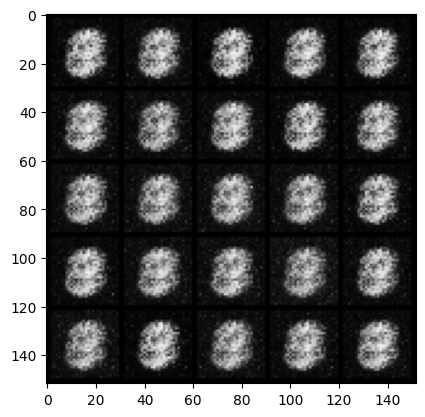

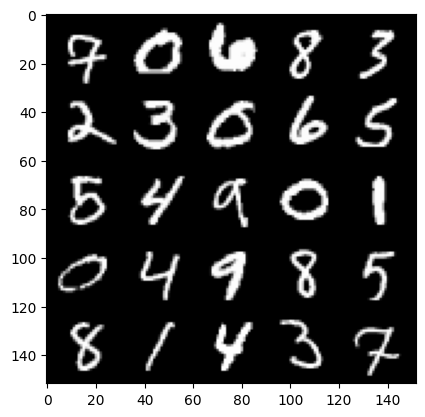

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.7554129574298845, discriminator loss: 0.2788460431993006


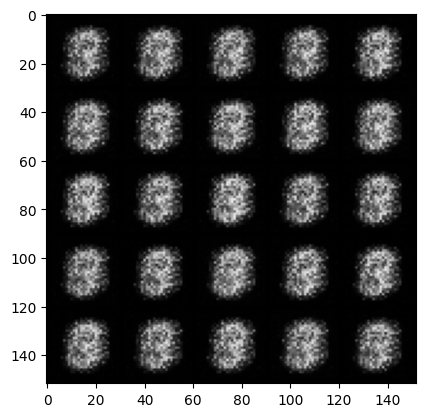

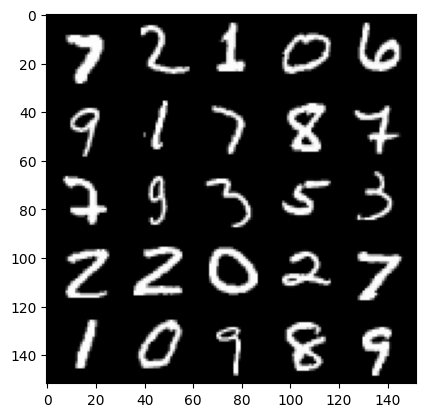

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 2.066983321189879, discriminator loss: 0.15764243254065516


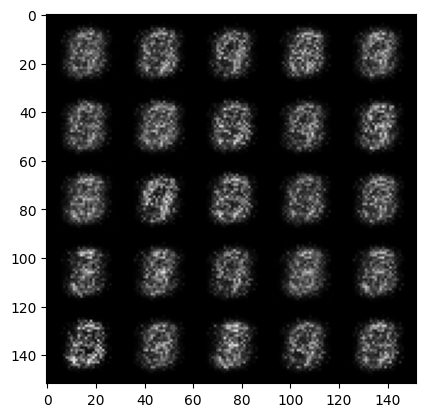

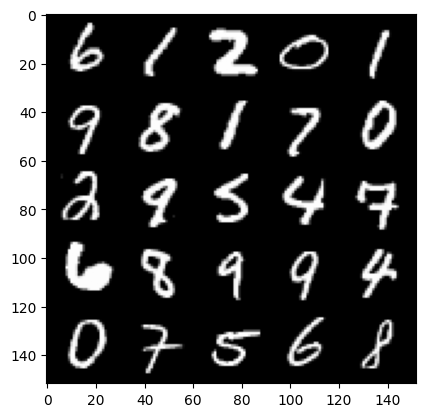

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.6666432456970213, discriminator loss: 0.2285540542304516


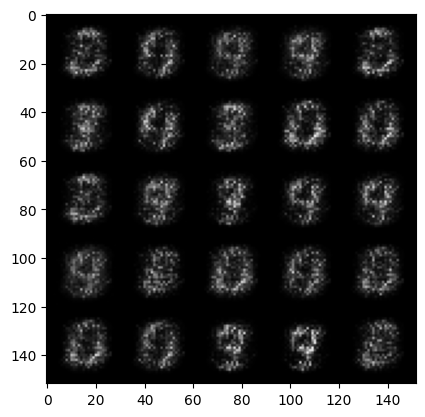

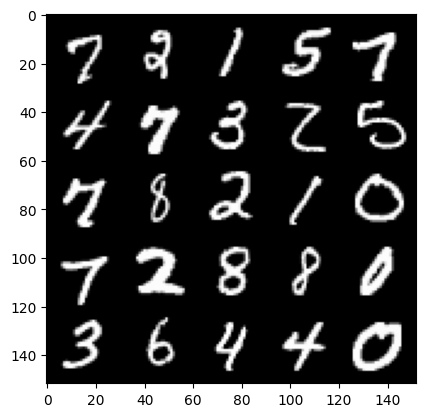

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.641177765130996, discriminator loss: 0.2106106818318367


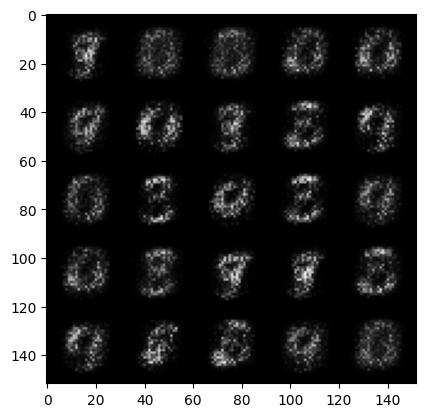

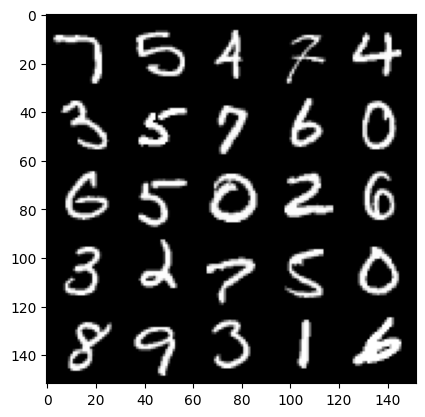

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.8986614131927482, discriminator loss: 0.1729631531536581


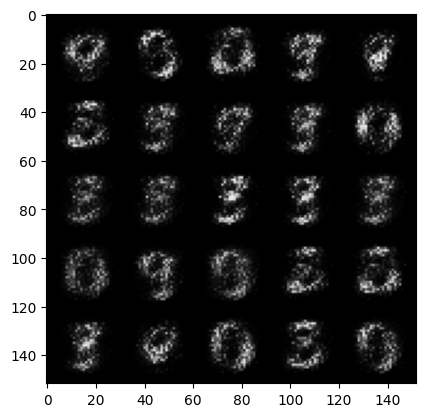

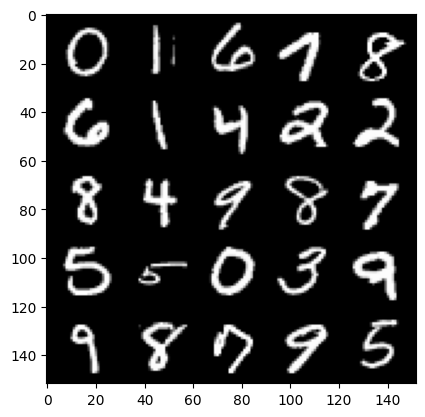

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.309857220172881, discriminator loss: 0.13742316100001342


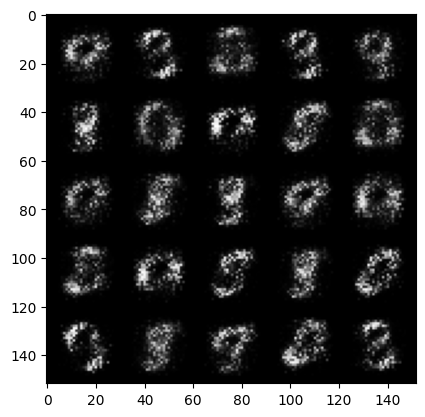

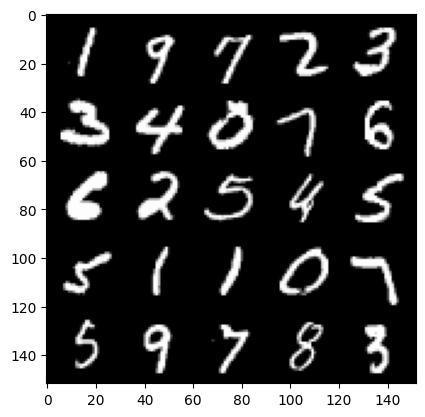

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.7230200123786923, discriminator loss: 0.10677345257997517


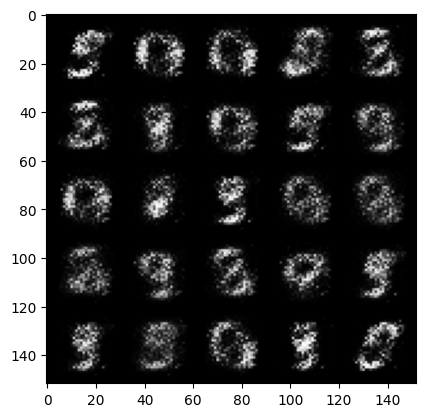

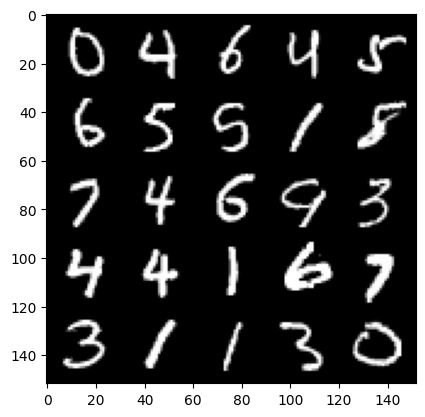

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.238760585784911, discriminator loss: 0.08137489247322088


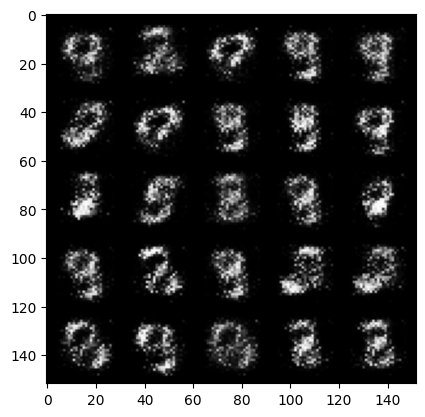

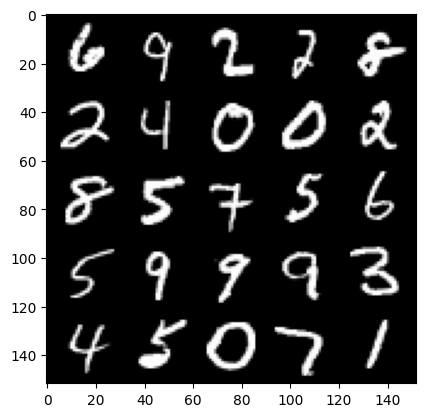

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.5675985941886896, discriminator loss: 0.06740855448693035


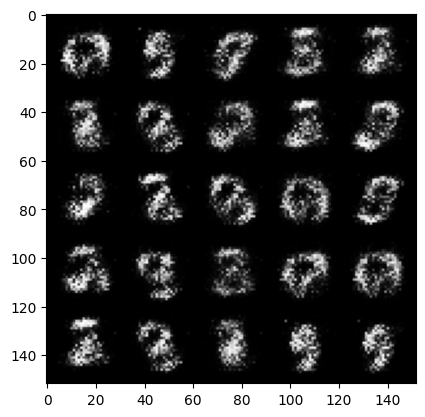

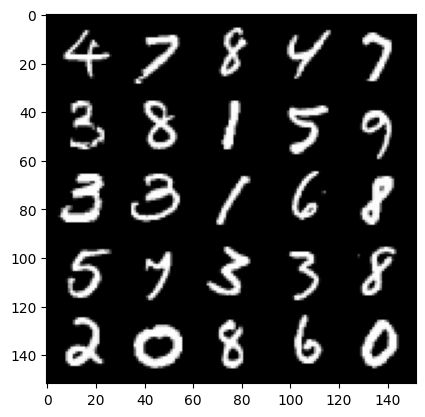

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.759953118324275, discriminator loss: 0.054447448797524015


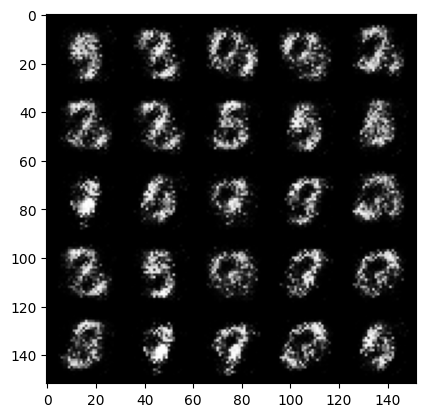

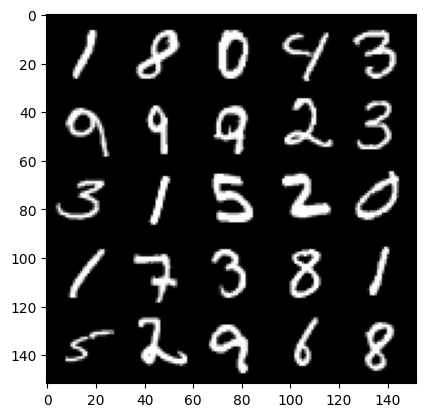

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 4.024593883514404, discriminator loss: 0.05380011986941098


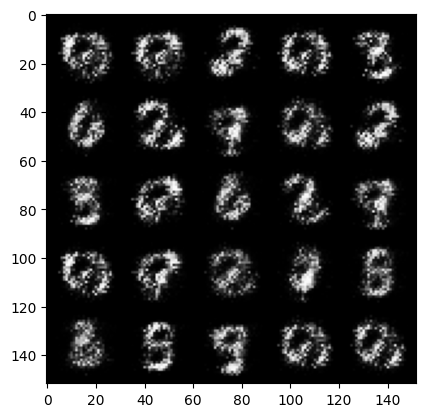

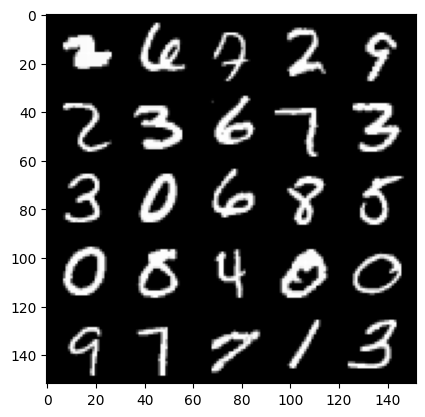

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 4.024299944400789, discriminator loss: 0.057738894306123265


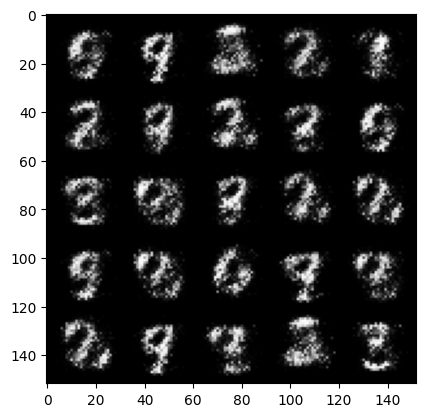

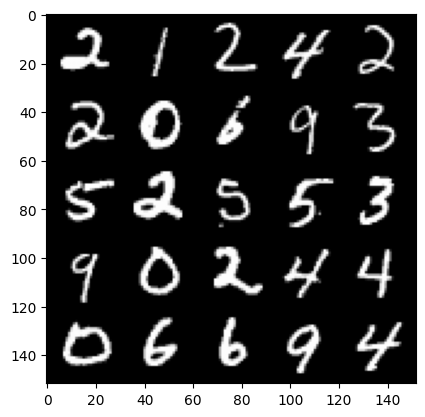

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.291739437103275, discriminator loss: 0.05060390754789113


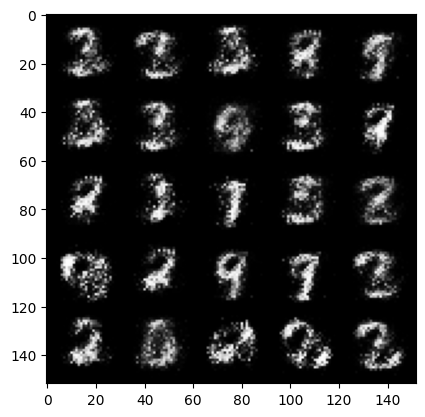

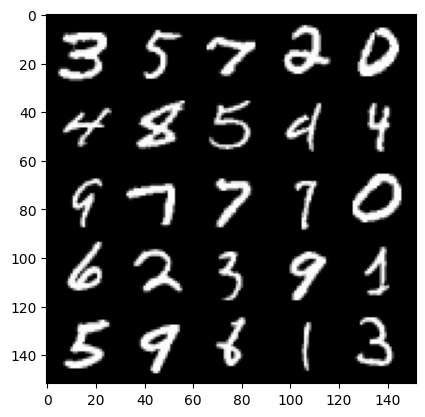

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.2880583562850925, discriminator loss: 0.04884509496018289


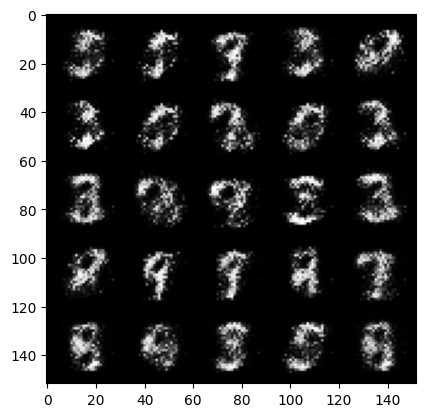

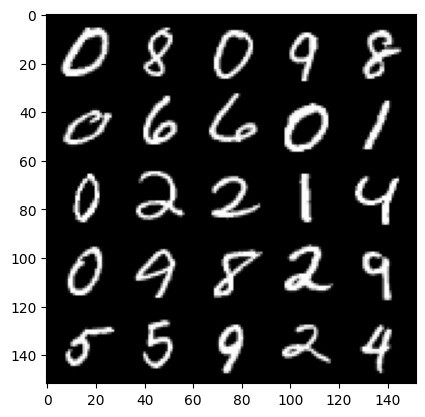

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.3072853374481195, discriminator loss: 0.05167630891129376


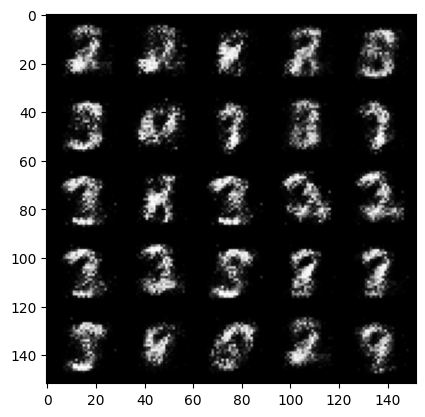

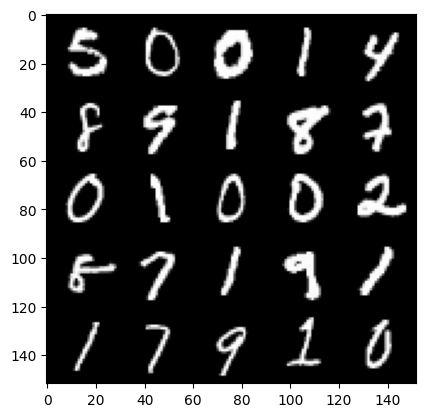

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.291804129600528, discriminator loss: 0.052315650526434235


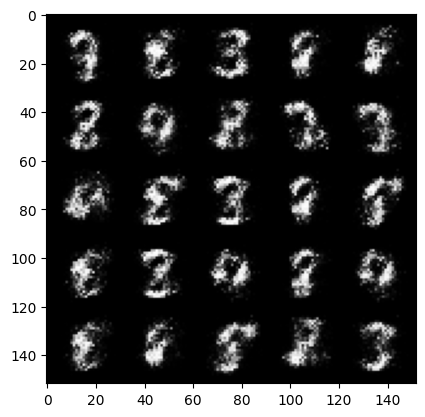

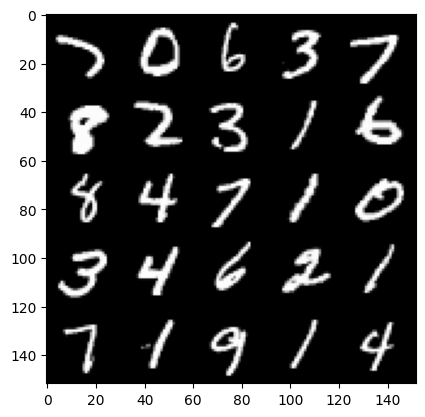

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.357493911266328, discriminator loss: 0.04897523547708989


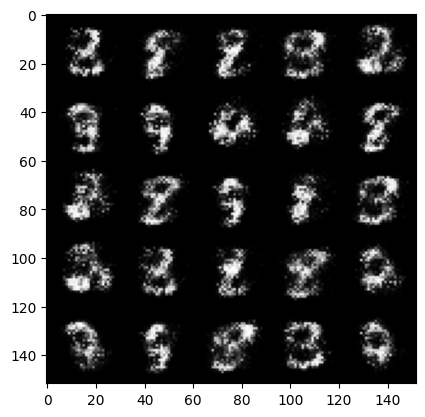

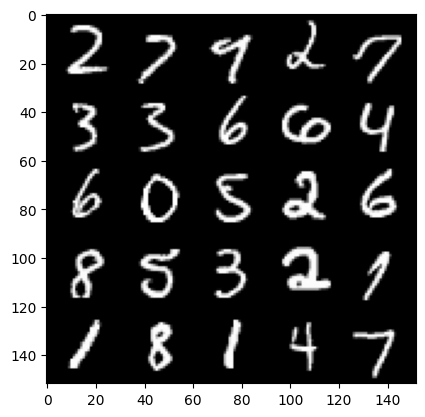

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.497840121269224, discriminator loss: 0.05166863417997955


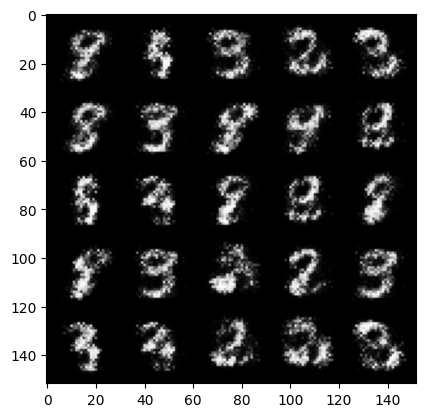

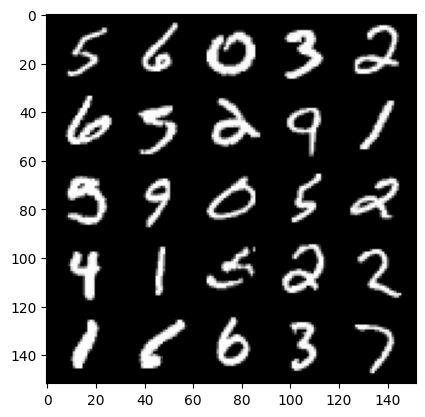

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.301060132026675, discriminator loss: 0.05527754443511361


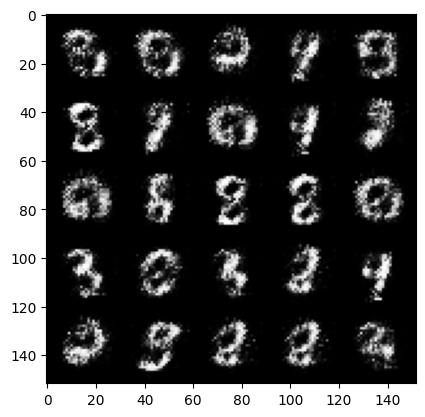

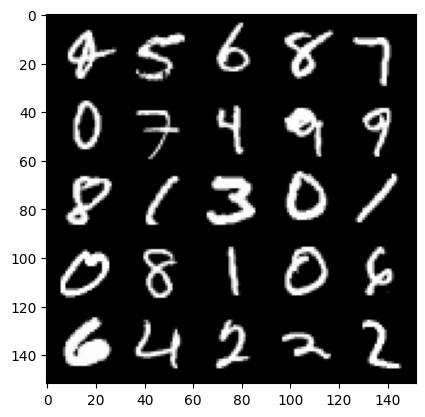

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.522344148159022, discriminator loss: 0.053467816188931504


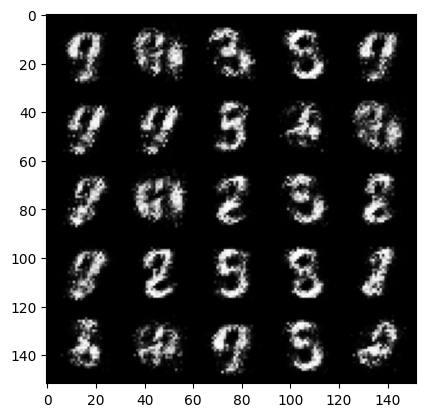

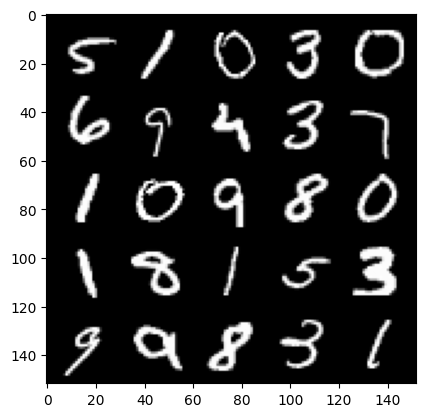

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.292990886211396, discriminator loss: 0.059159224633127394


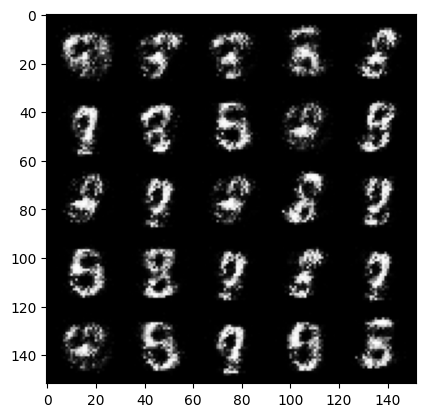

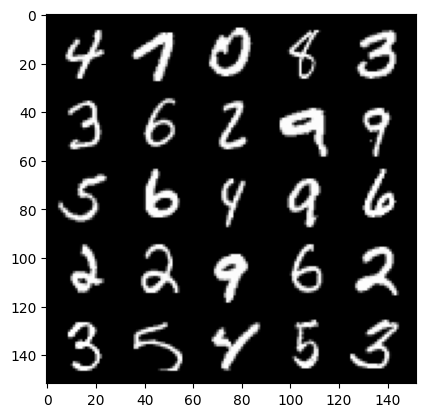

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 4.396400636672968, discriminator loss: 0.05590262372419243


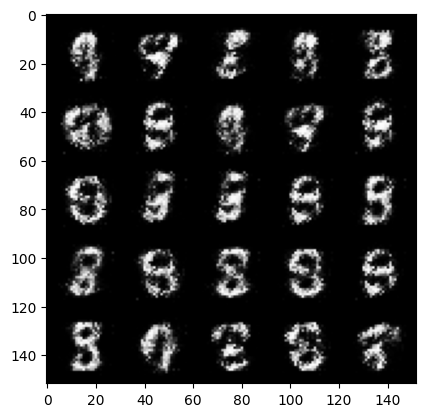

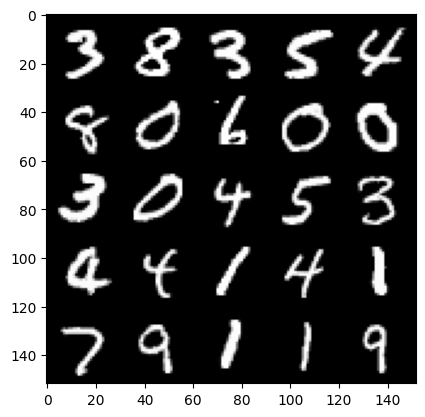

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.265508045196534, discriminator loss: 0.05726247575134036


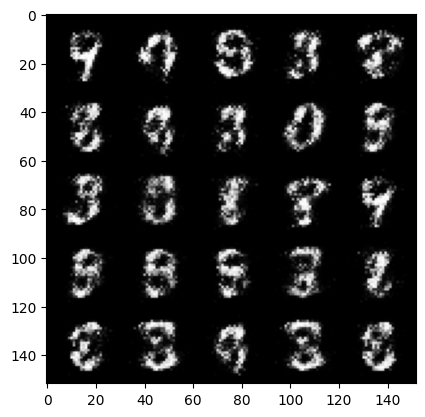

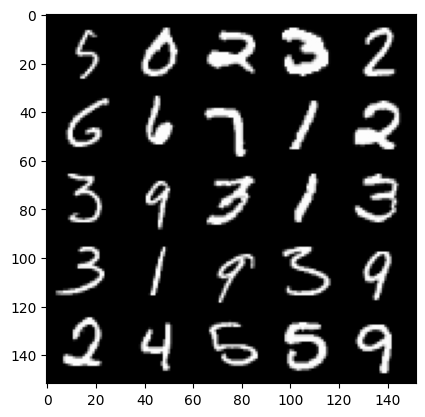

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 4.3449441103935245, discriminator loss: 0.06450079347938296


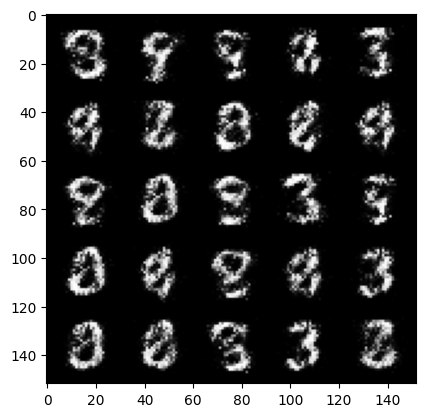

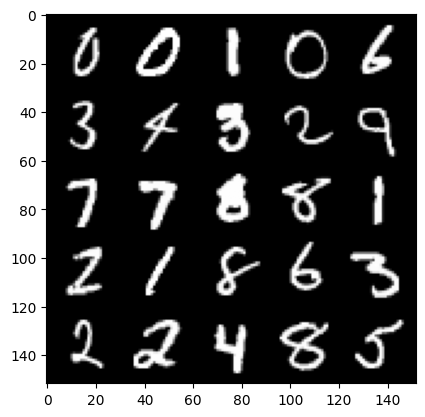

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 4.2728745212554955, discriminator loss: 0.07855898500233889


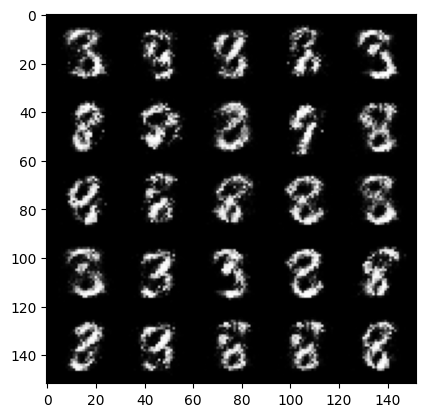

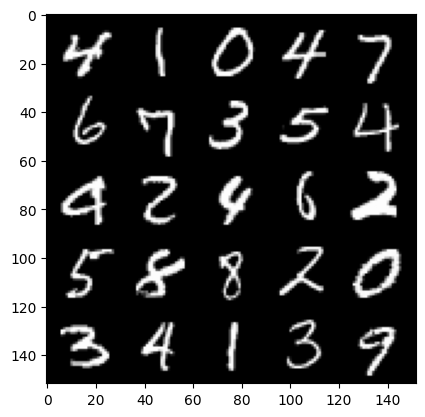

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 4.083911587715151, discriminator loss: 0.08843183809518806


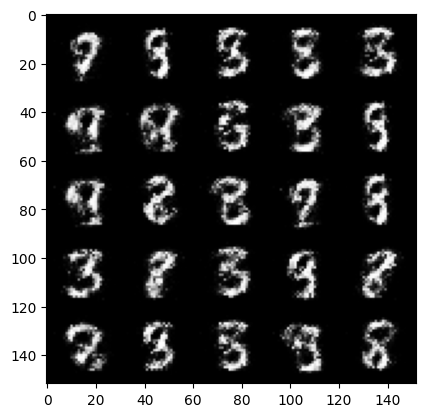

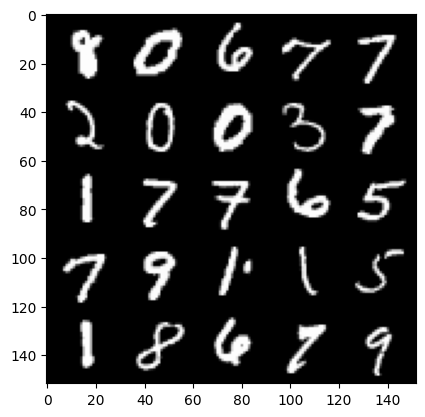

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.9939195685386637, discriminator loss: 0.09044510412216189


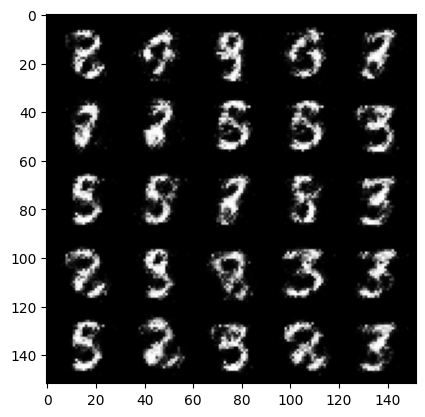

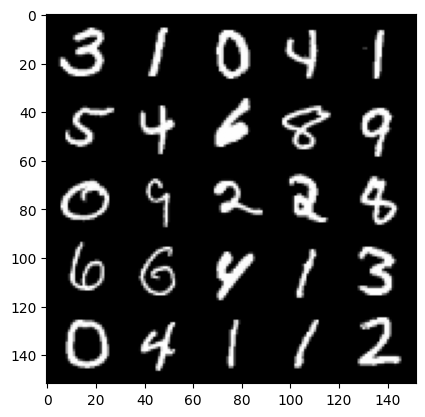

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 4.060159804344179, discriminator loss: 0.08892102033644916


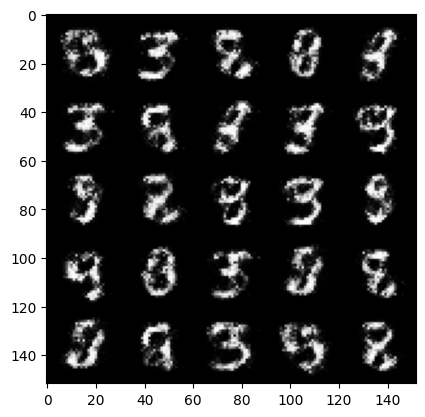

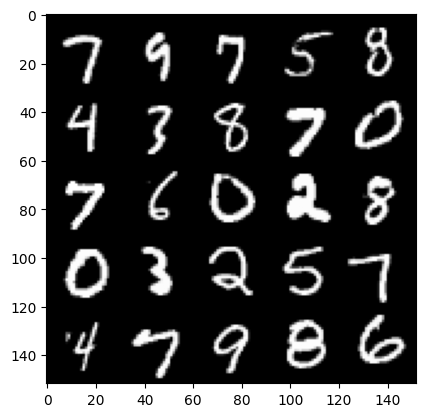

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.8853467421531653, discriminator loss: 0.10893462629616245


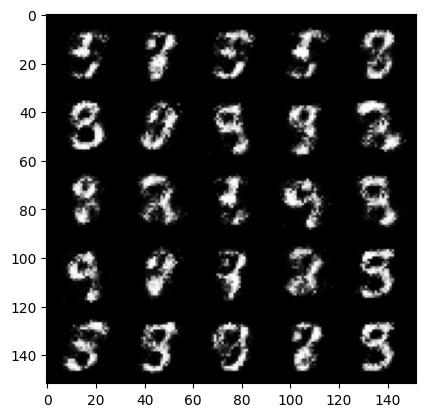

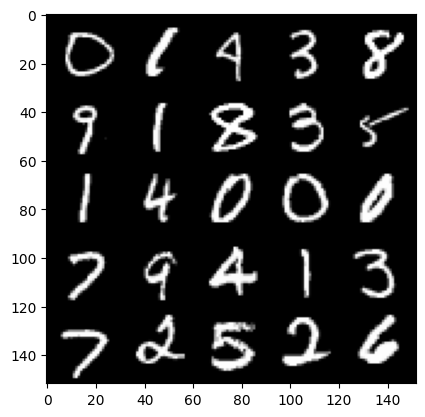

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.657978702068326, discriminator loss: 0.11084318786859516


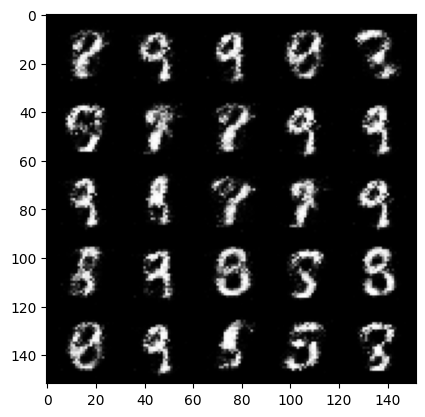

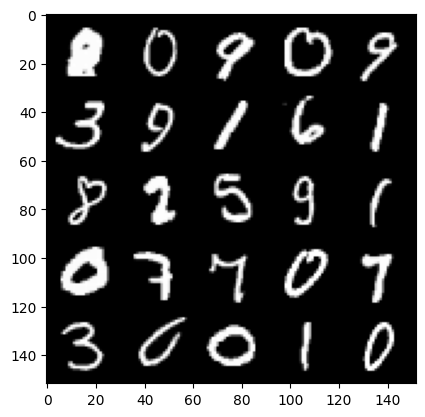

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.6079334001541152, discriminator loss: 0.10681703098118318


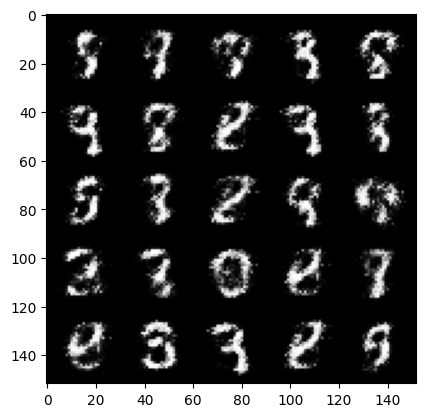

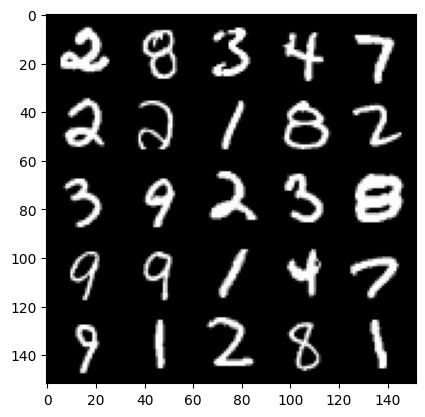

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.703419775485994, discriminator loss: 0.10593503223359582


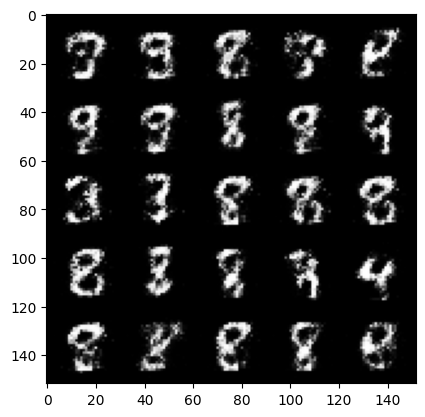

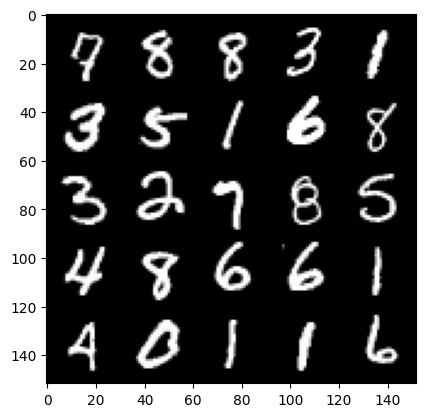

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.6949525899887052, discriminator loss: 0.112258657604456


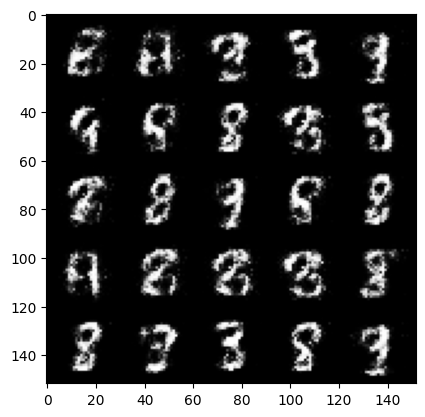

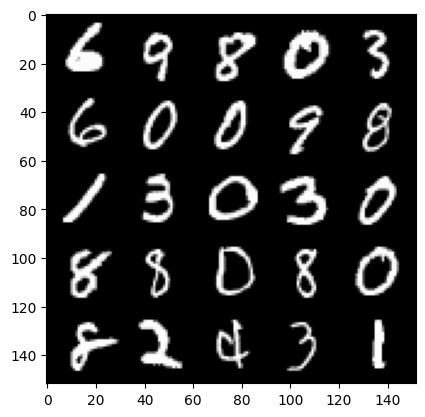

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.6174097318649276, discriminator loss: 0.12103381991386414


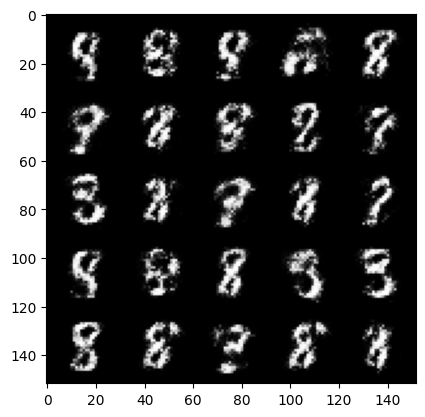

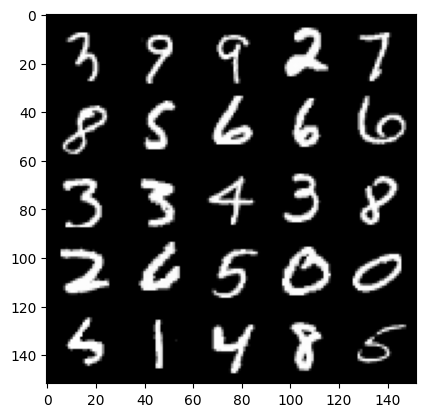

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.4677940454483047, discriminator loss: 0.13451915724575522


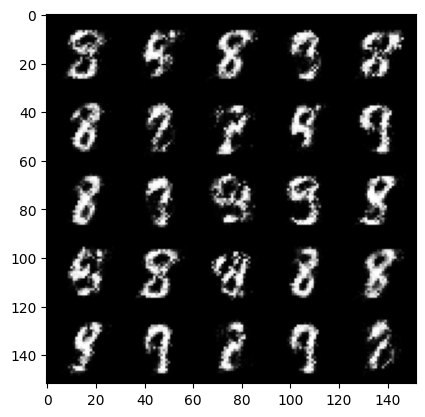

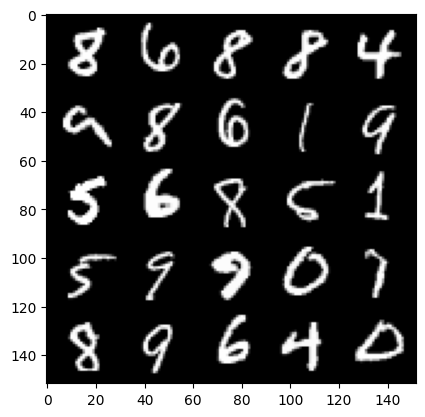

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.43591990470886, discriminator loss: 0.13130559973418712


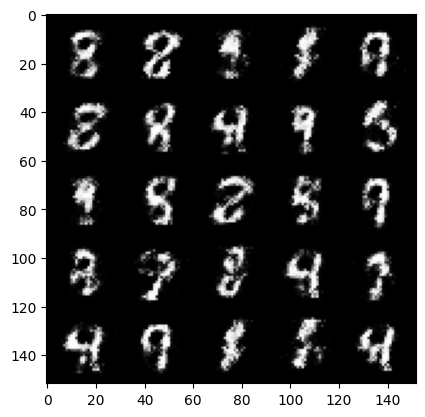

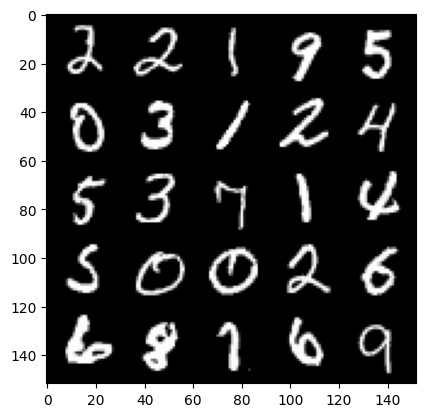

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.1742351045608532, discriminator loss: 0.15757676695287237


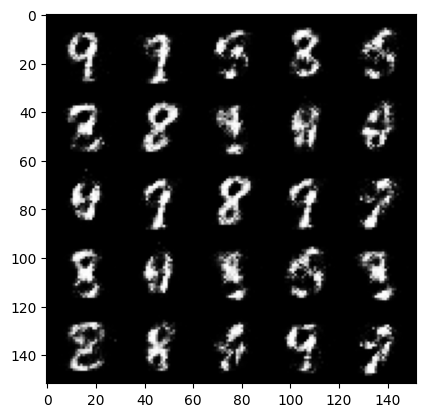

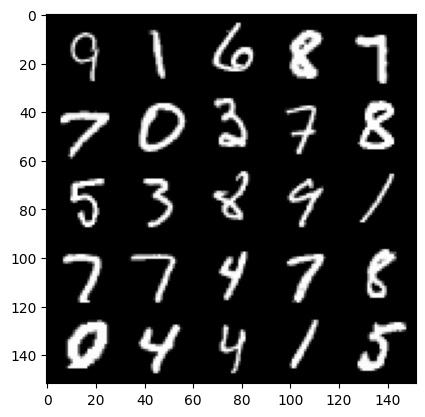

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.114581963539124, discriminator loss: 0.16639404247701178


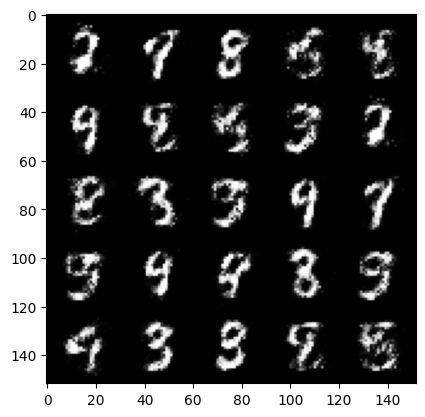

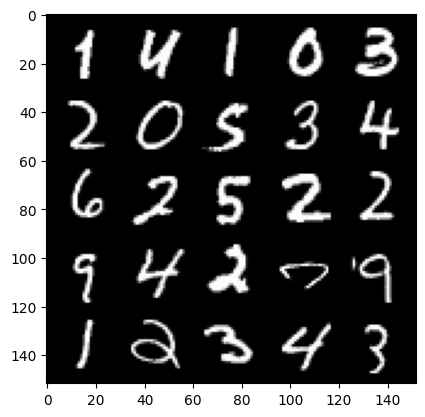

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.1188953299522386, discriminator loss: 0.16853971850872027


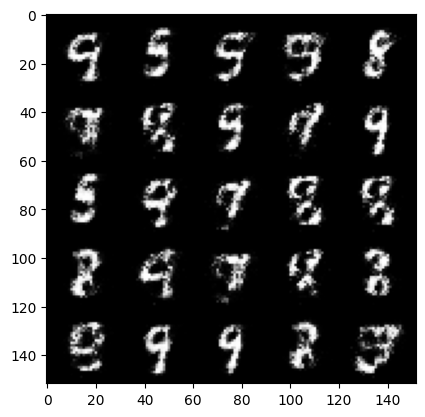

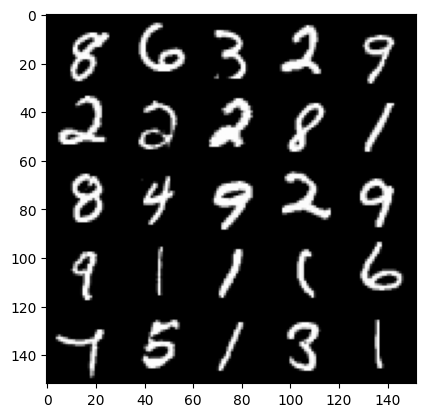

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.0444546546936047, discriminator loss: 0.1678300174325702


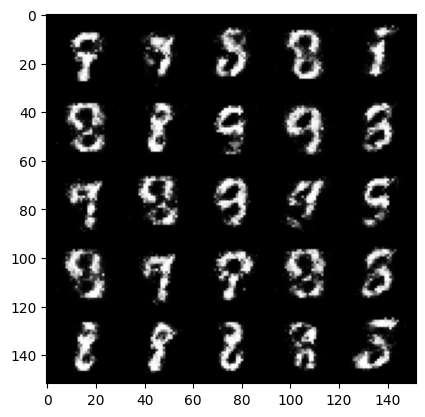

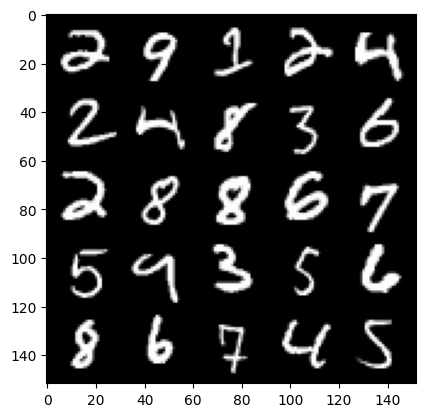

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.0934903593063354, discriminator loss: 0.16162813548743724


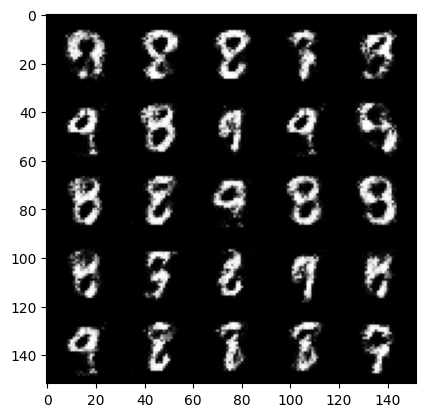

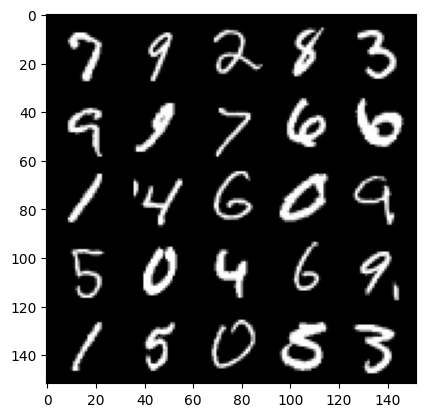

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.075070000171663, discriminator loss: 0.15644700589776042


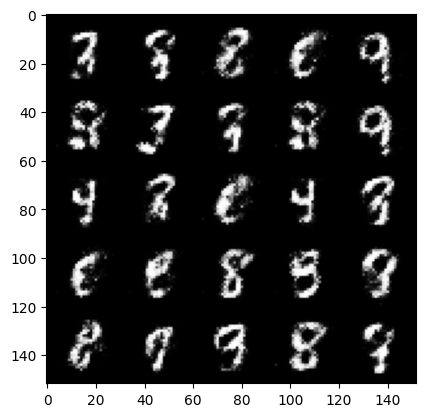

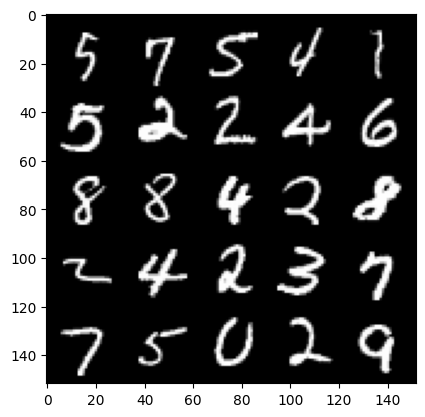

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.0898404588699333, discriminator loss: 0.16747240349650386


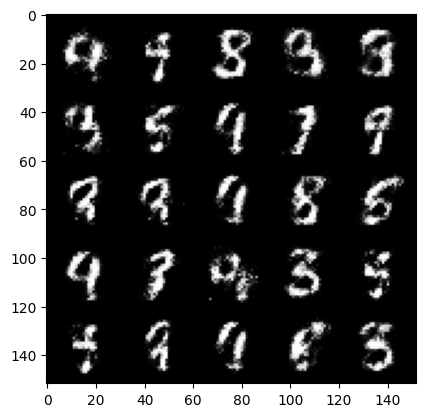

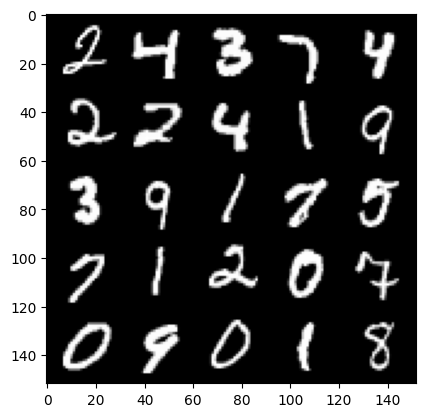

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.1355010757446307, discriminator loss: 0.1668037976622581


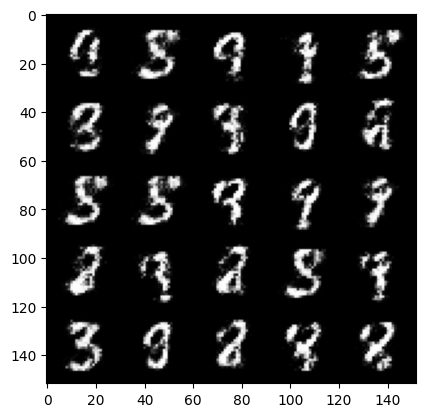

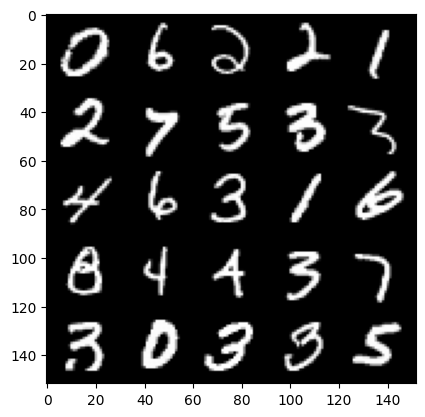

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.0357836151123068, discriminator loss: 0.17131754557788373


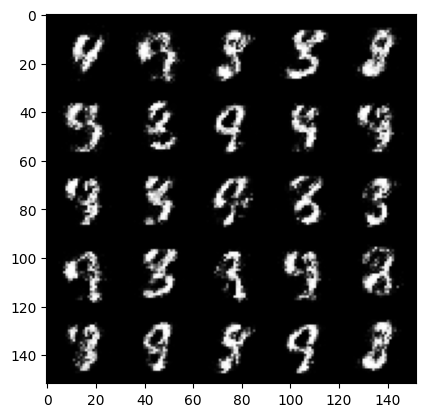

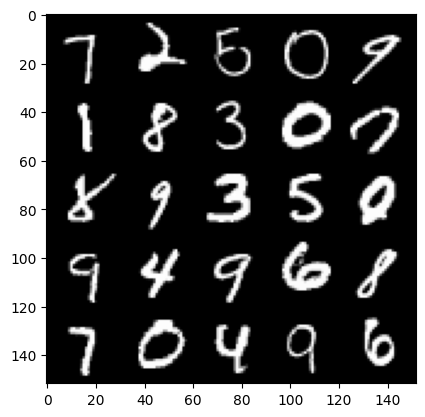

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.047958021163946, discriminator loss: 0.17165548409521597


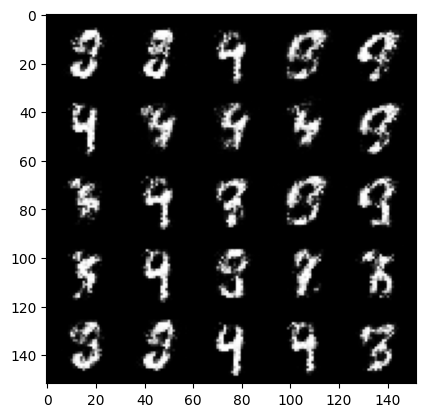

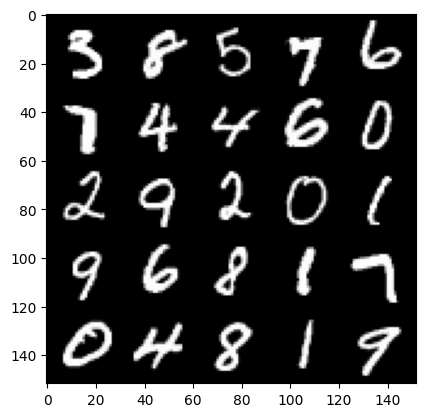

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 2.9919863033294662, discriminator loss: 0.17709648911654935


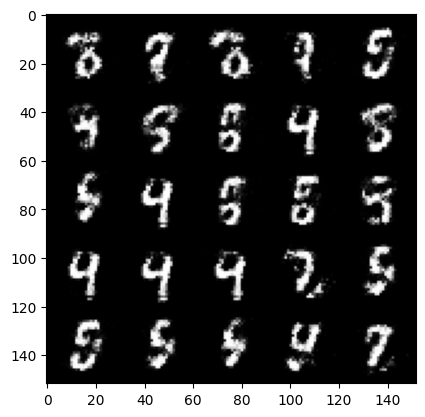

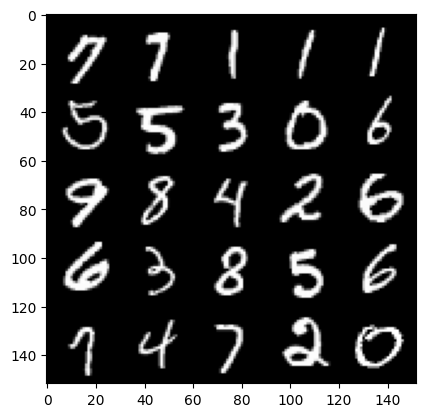

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 2.9960717453956622, discriminator loss: 0.16364944852888594


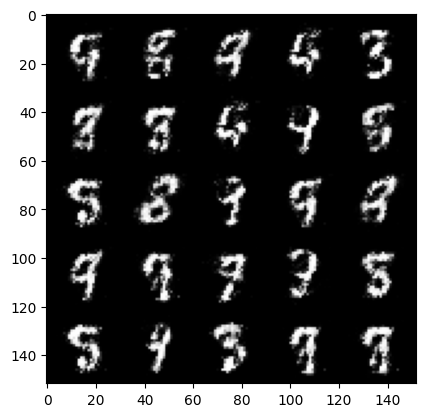

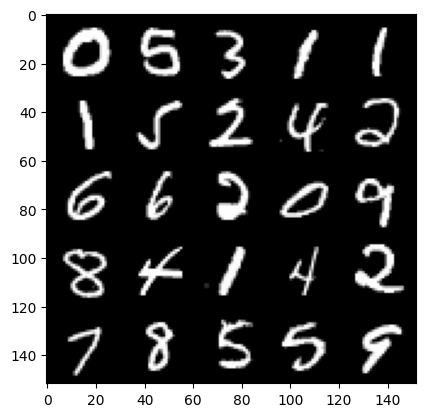

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 3.0520545186996473, discriminator loss: 0.16985516087710859


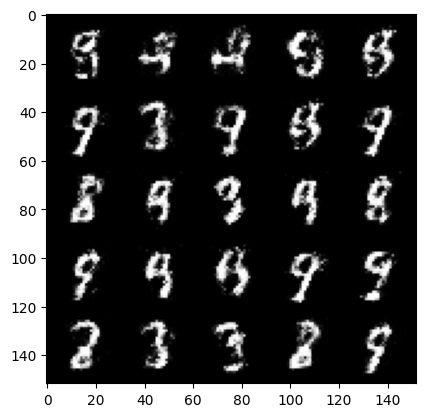

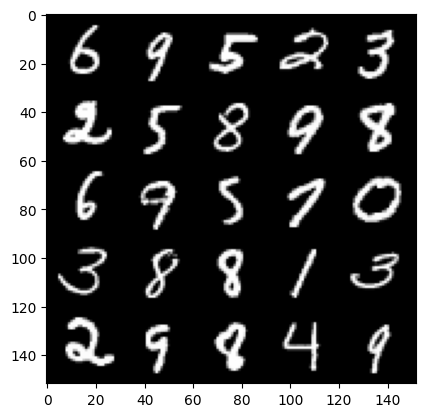

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.987442564487459, discriminator loss: 0.17399366308748737


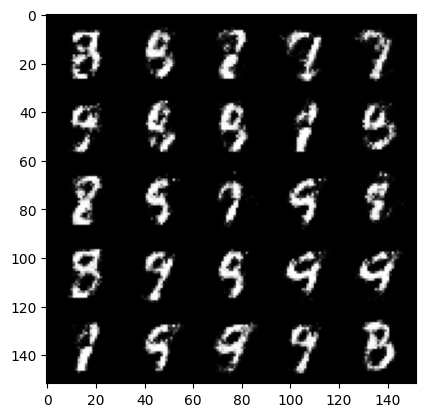

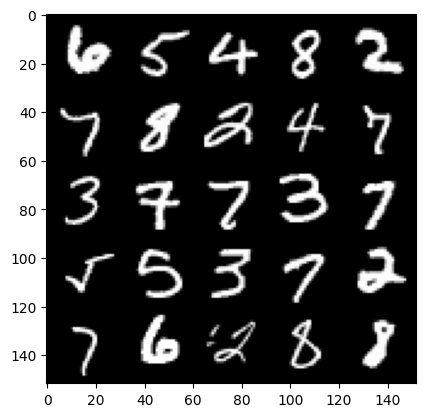

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.828956055641175, discriminator loss: 0.19453937320411224


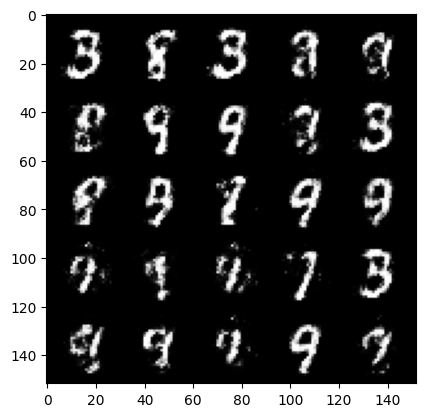

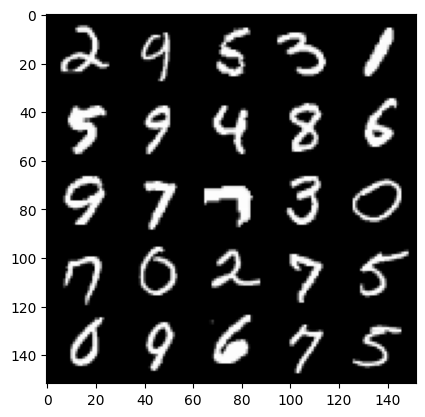

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.7687601361274705, discriminator loss: 0.19090079775452626


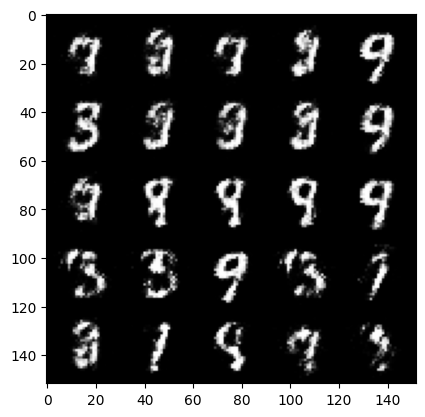

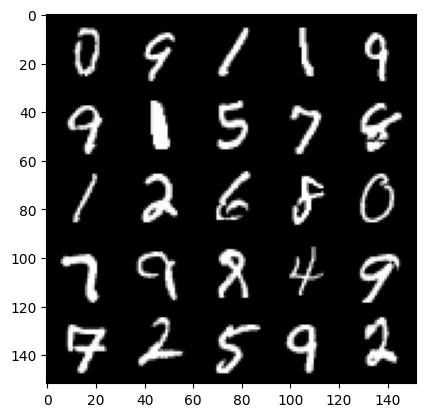

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.9382980141639705, discriminator loss: 0.17181017167866214


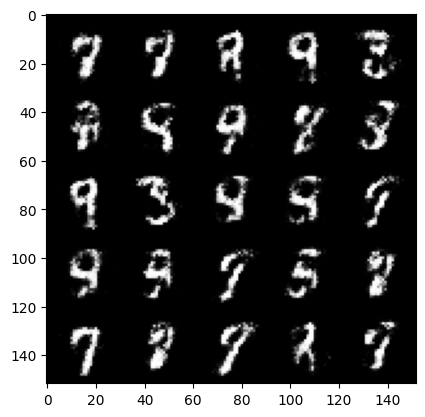

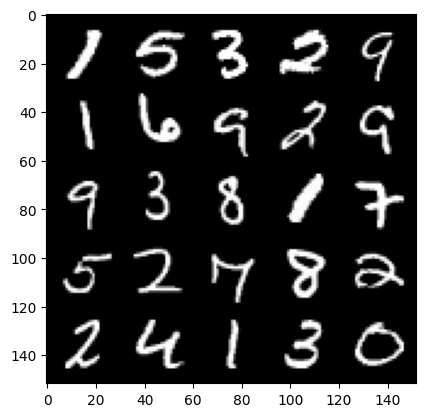

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.8119622664451596, discriminator loss: 0.18361699922382815


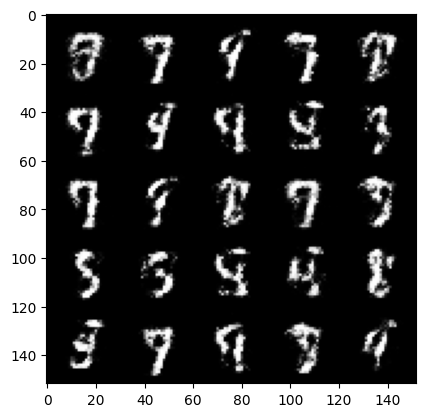

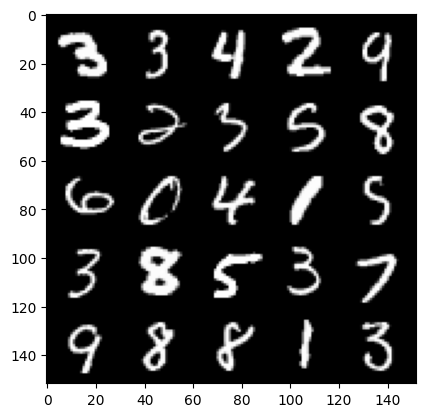

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.8931008033752463, discriminator loss: 0.18471173979341995


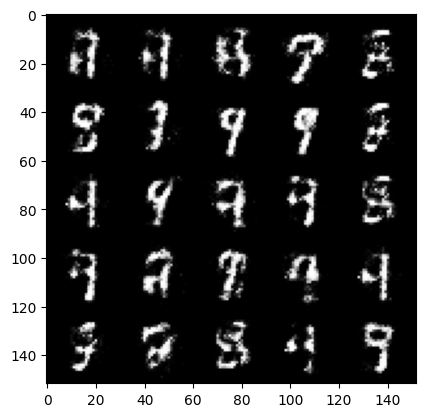

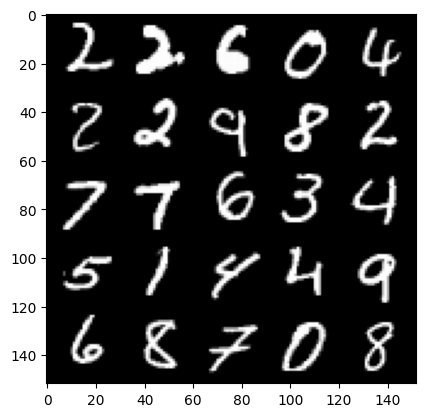

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.7052223739624015, discriminator loss: 0.22135156834125524


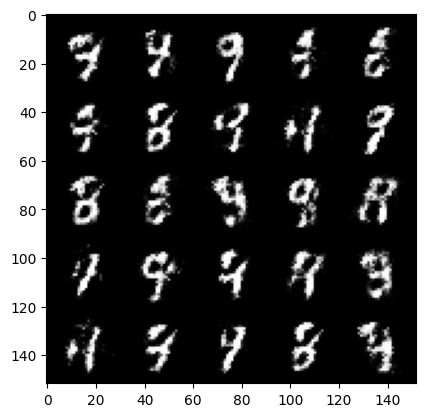

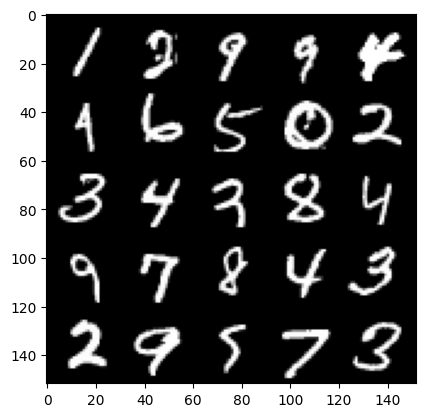

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.5450172457694995, discriminator loss: 0.23080894264578808


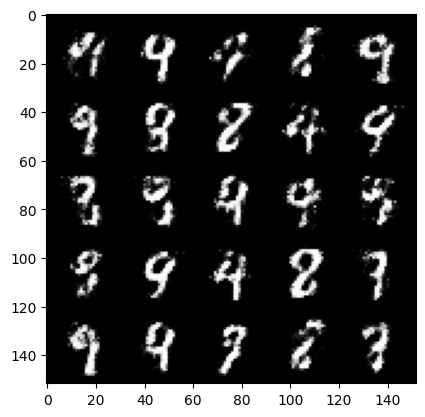

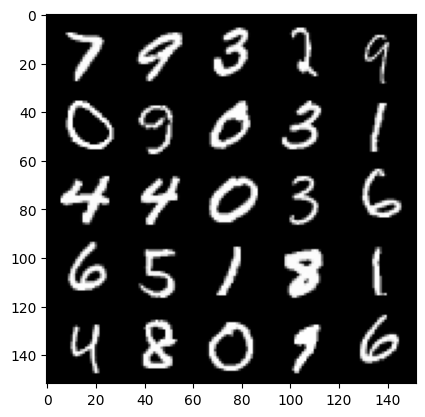

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.6018994455337543, discriminator loss: 0.22080642202496517


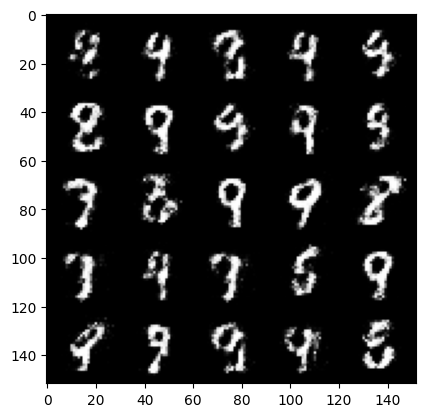

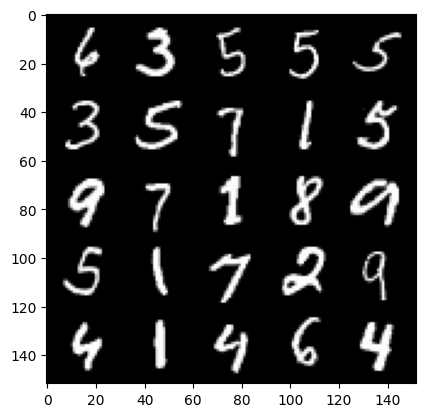

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.5826070256233207, discriminator loss: 0.2223902732282877


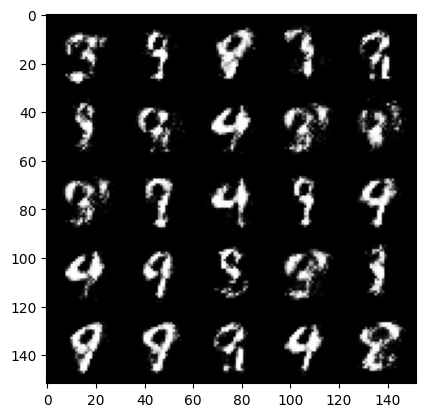

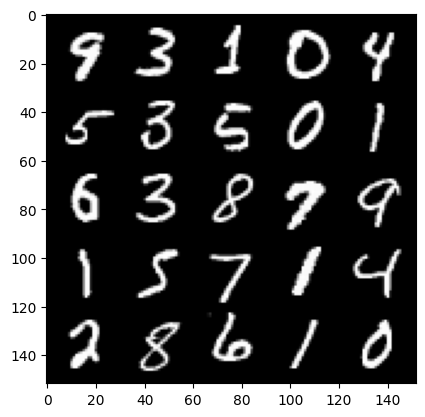

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.641916107177736, discriminator loss: 0.21669419944286322


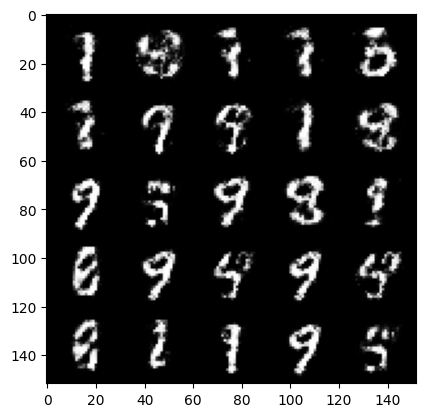

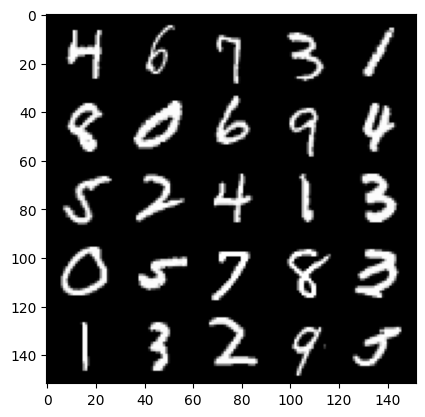

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.4539233760833734, discriminator loss: 0.24334915637969975


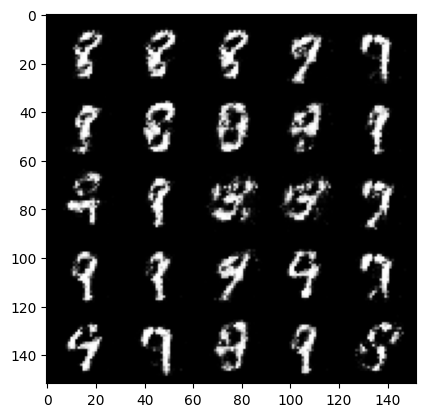

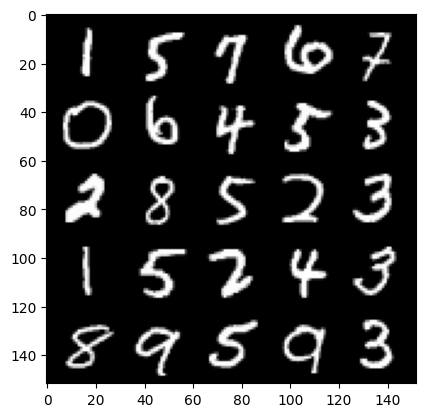

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.3898105852603915, discriminator loss: 0.24867696014046678


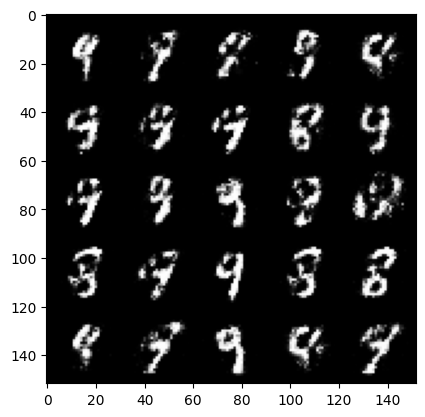

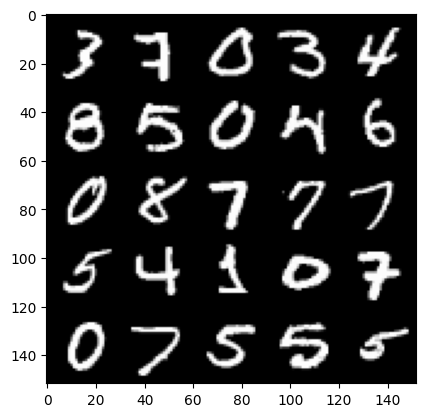

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.5264335811138134, discriminator loss: 0.2298462541103365


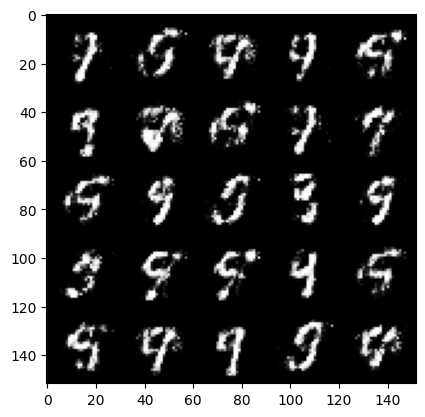

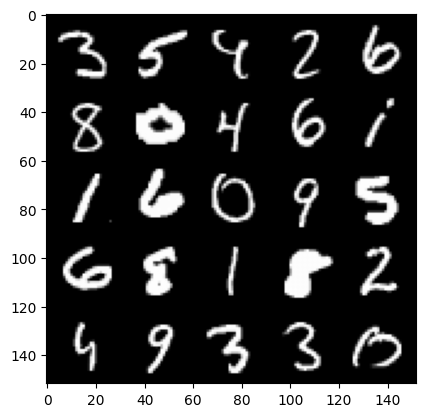

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.533805562973022, discriminator loss: 0.226360823780298


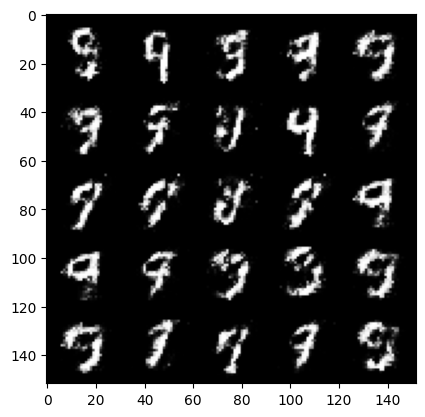

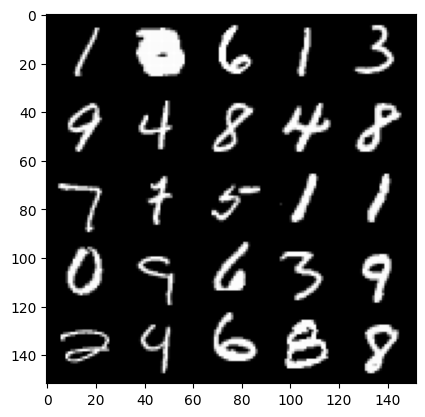

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.380899799585344, discriminator loss: 0.2661405201554299


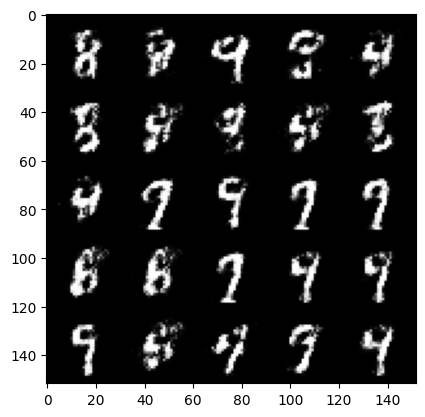

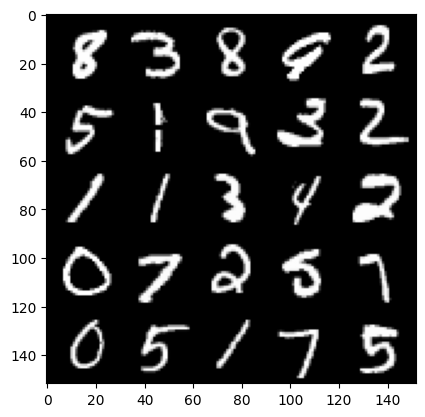

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.425552232503891, discriminator loss: 0.22861060708761208


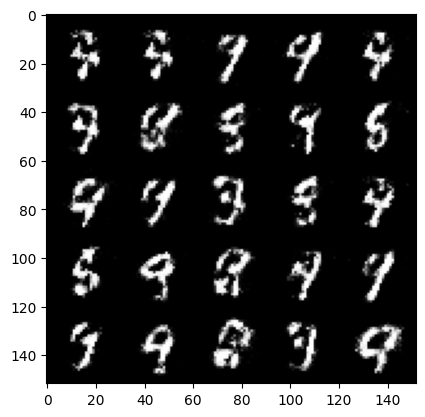

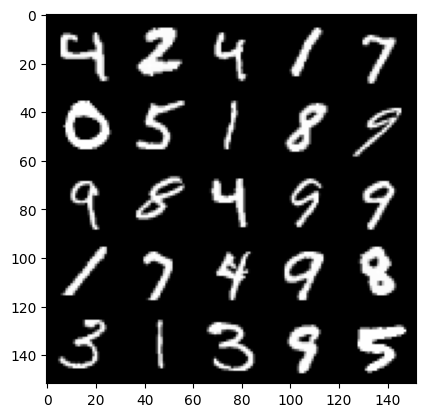

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.4678221600055714, discriminator loss: 0.23215272051095964


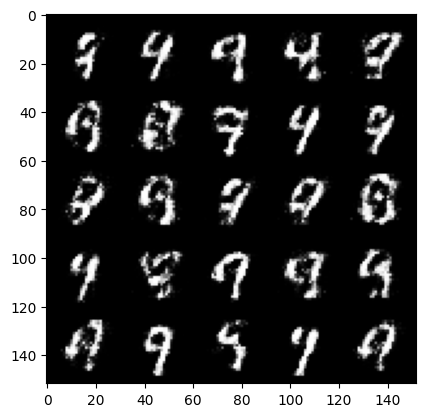

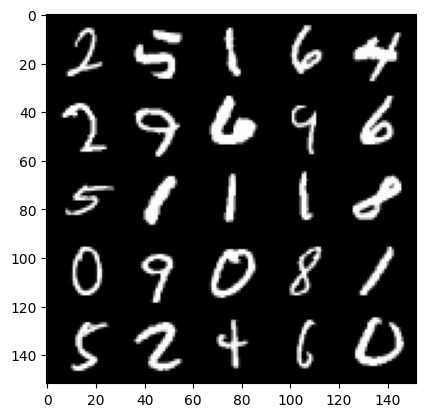

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.2809522476196293, discriminator loss: 0.26732453542947765


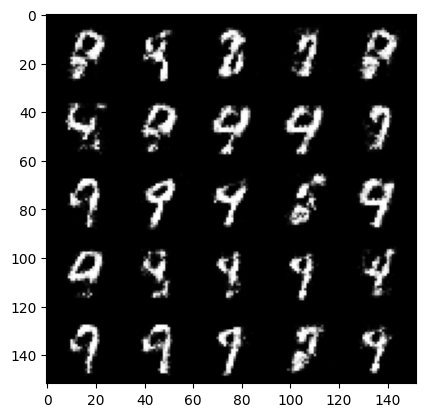

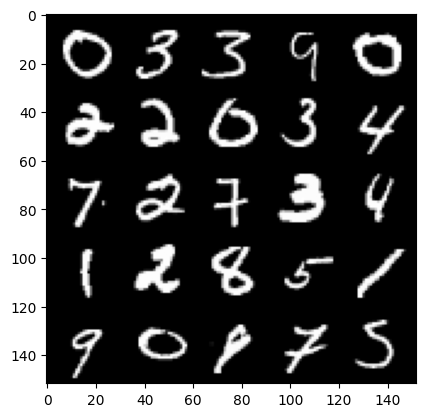

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.2825437066555057, discriminator loss: 0.2527570477426052


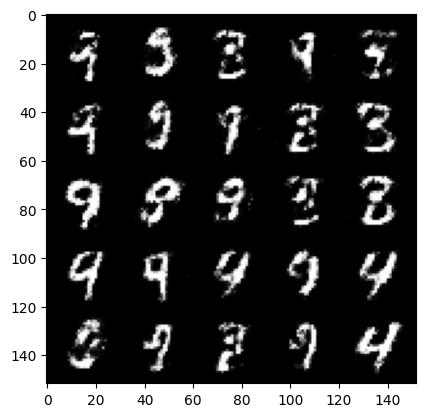

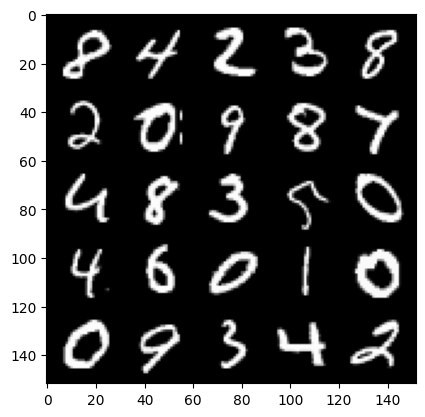

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.440881993055345, discriminator loss: 0.22648319497704492


In [ ]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1